# Map Viz

This notebook will provide some map visualization examples using some popular viz packages.
- Choropleth map with data classification
- Legendgram
- Proportional symbol map
- Kernel density map
- geoplot
- contextily
- folium
- plotly

I will be using some previous florida data as examples.

In [1]:
import pandas as pd
import numpy as np
import geopandas as gpd
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
path = "https://raw.githubusercontent.com/Ziqi-Li/GIS5103/main/data/fl_income.geojson"
fl_income = gpd.read_file(path)

<Axes: >

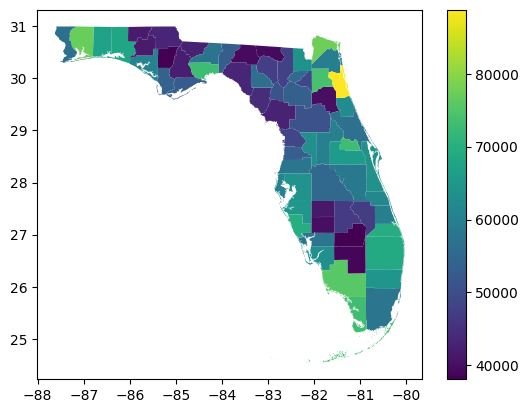

In [3]:
fl_income.plot("Median_income",legend=True)


#Save figure using .savefig, with a certain dpi
#plt.savefig("Median_income_map.png", dpi=600)  # https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.savefig.html

## `mapclassify` for map data classification

Why Classify Data?: The primary reason to classify data is to simplify the data for visual display. For instance, if we assign a unique color to each county in FL based on its median income (referred to as an unclassed map) it is a bit more difficult to link a specific value with a specific color.

However, if we group the data values in some fashion (classify the data), it is easier to observe the data patterns.

In [4]:
#pip install mapclassify

In [5]:
import mapclassify

In [6]:
value = fl_income["Median_income"]

## Data classification methods

`mapclassify` supports popular classification methods.

| Method          | Strengths                                        | Weaknesses                                                       |
|-----------------|--------------------------------------------------|------------------------------------------------------------------|
| **Quantile**     | Equal number of items per class                  | Can result in unequal class ranges                               |
| **Equal Interval** | Simple to understand, emphasizes actual data ranges | Can produce unbalanced classes if data is skewed                 |
| **Natural Breaks** | Identifies clusters, meaningful class divisions   | Can result in uneven class sizes and computationally intensive    |
| **Fisher-Jenks**  | Optimized natural breaks, better variance minimization | Same weaknesses as Natural Breaks (uneven class sizes)            |


In [7]:
classifier = mapclassify.Quantiles(value, k=5)  # k is number of classes

#mapclassify.Quantiles(fl_income['Median_income'], k=5)
#mapclassify.EqualInterval(fl_income['Median_income'], k=5)
#mapclassify.FisherJenks(fl_income['Median_income'], k=5)
#mapclassify.NaturalBreaks(fl_income['Median_income'], k=5


# yb contains the bin IDs (or classes) for each classification
fl_income['income_class'] = classifier.yb

#color map
cmap = plt.cm.OrRd

In [8]:
classifier.yb

array([1, 0, 1, 4, 0, 4, 3, 2, 0, 2, 1, 0, 0, 0, 3, 1, 3, 0, 4, 3, 3, 4,
       0, 1, 2, 1, 3, 0, 3, 4, 4, 1, 1, 3, 1, 2, 2, 2, 2, 1, 4, 3, 2, 2,
       1, 3, 4, 2, 4, 4, 4, 0, 0, 4, 0, 2, 4, 0, 3, 0, 3, 3, 2, 1, 1, 2,
       4])

In [9]:
fl_income.head()

,COUNTY,COUNTYNAME,Geo_ID,Name,Median_income,geometry,income_class
0,041,GILCHRIST,0500000US12041,"Gilchrist County, Florida",50983,"POLYGON ((-82.65814 29.83028, -82.65887 29.830...",1
1,107,PUTNAM,0500000US12107,"Putnam County, Florida",39975,"POLYGON ((-81.58084 29.83956, -81.60611 29.839...",0
2,123,TAYLOR,0500000US12123,"Taylor County, Florida",43563,"MULTIPOLYGON (((-83.73037 30.30358, -83.73987 ...",1
3,091,OKALOOSA,0500000US12091,"Okaloosa County, Florida",67390,"MULTIPOLYGON (((-86.39159 30.6497, -86.39157 3...",4
4,013,CALHOUN,0500000US12013,"Calhoun County, Florida",38098,"POLYGON ((-84.93266 30.60637, -84.95729 30.606...",0


In [10]:
import matplotlib.patches as mpatches

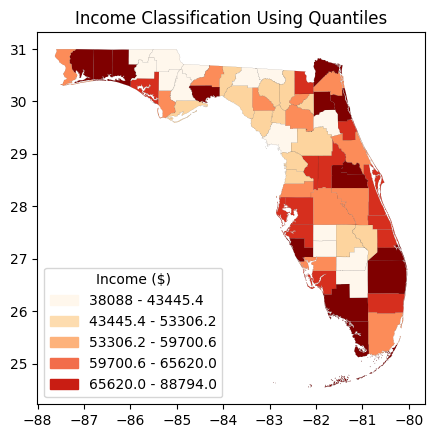

In [11]:
fig, ax = plt.subplots(1, 1, figsize=(5, 5))
fl_income.plot(ax=ax, column='income_class', linewidth=0.05, cmap=cmap, edgecolor="black")

# Define legend label
# classifier.bins gives the value ranges for every class
# 
legend_labels = [f"{round(lower, 2)} - {round(upper, 2)}" for lower, upper in zip([min(value)] + list(classifier.bins[:-1]), classifier.bins)]

# Create custom patches for the legend (one for each class)
patches = [mpatches.Patch(color=cmap(i / (len(classifier.bins))), label=legend_labels[i]) for i in range(len(legend_labels))]

plt.legend(handles=patches, loc='lower left', title="Income ($)", frameon=True)

# Add title to the plot
plt.title(f'Income Classification Using Quantiles');

Put all classification methods into one single map

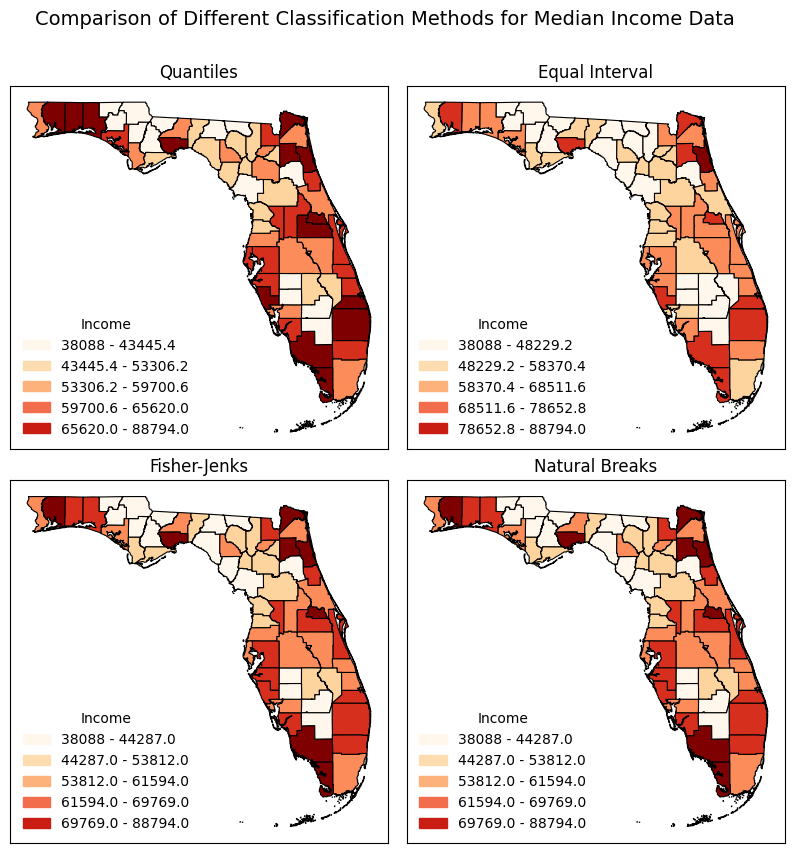

In [12]:
# Define different classification methods we want to compare
# Dictionary
classifiers = {
    "Quantiles": mapclassify.Quantiles(fl_income['Median_income'], k=5),
    "Equal Interval": mapclassify.EqualInterval(fl_income['Median_income'], k=5),
    "Fisher-Jenks": mapclassify.FisherJenks(fl_income['Median_income'], k=5),
    "Natural Breaks": mapclassify.NaturalBreaks(fl_income['Median_income'], k=5)
}

# Create a colormap (you can change the color palette as needed)
cmap = plt.cm.OrRd

# Set up subplots (2x2 grid for four classification methods)
fig, axs = plt.subplots(2, 2, figsize=(10, 10))

# Adjust spacing between subplots (both methods work, the numbers are not the same)
fig.subplots_adjust(hspace=0.05, wspace=0.05)
#fig.tight_layout(pad=2)

# Flatten axes array for easier iteration
axs = axs.flatten()

# Plot each classification method in a subplot
for i, (name, classifier) in enumerate(classifiers.items()):
    fl_income['income_class'] = classifier.yb  # Assign classification labels

    # Plot classified data
    fl_income.plot(column='income_class', cmap=cmap, linewidth=0.8, ax=axs[i], edgecolor='black')
    
    # Create custom discrete legend
    legend_labels = [f"{round(lower, 2)} - {round(upper, 2)}" for lower, upper in zip([min(fl_income['Median_income'])] + list(classifier.bins[:-1]), classifier.bins)]
    patches = [mpatches.Patch(color=cmap(j / (len(classifier.bins))), label=legend_labels[j]) for j in range(len(legend_labels))]

    # Add title and custom legend to each subplot
    axs[i].set_title(name)
    axs[i].legend(handles=patches, loc='lower left', title="Income", frameon=False)
    
    axs[i].set_xticks([]) #removes the ticks along the x-axis.
    axs[i].set_yticks([]) #removes the ticks along the y-axis.

# Add an overall title for the figure
fig.suptitle('Comparison of Different Classification Methods for Median Income Data', fontsize=14, y=0.95);

#save figure to an image
#plt.savefig("maps.png", dpi=300)

notice color mismatch between legend and map? 
probably an issue with the python package.

In [13]:
#help(mapclassify.EqualInterval)
# if you wanted to define your own intervals for legend
mapclassify.UserDefined(y=fl_income["Median_income"], bins=[40000, 60000, 80000, 100000])

UserDefined

       Interval          Count
------------------------------
[ 38088.00,  40000.00] |     7
( 40000.00,  60000.00] |    34
( 60000.00,  80000.00] |    25
( 80000.00, 100000.00] |     1

## [GeoPlot](https://residentmario.github.io/geoplot/index.html)

In [14]:
#pip install geoplot

Text(0.5, 1.0, 'County Median Income')

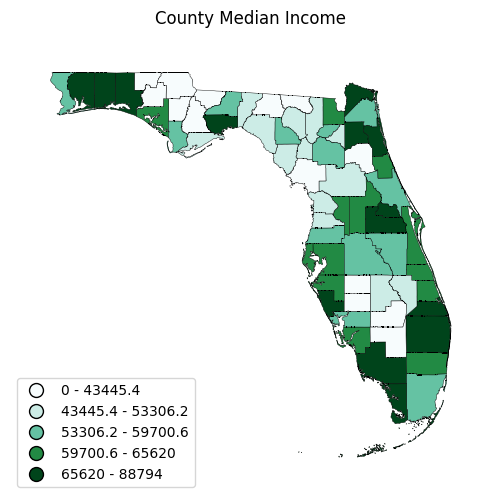

In [15]:
import geopandas as gpd
import geoplot as gplt
import geoplot.crs as gcrs
import matplotlib.pyplot as plt


gplt.choropleth(
    fl_income, #GeoDataFrame
    hue='Median_income', #color by what value
    cmap='BuGn', linewidth=0.3, #stlyes
    edgecolor='black',
    legend=True,
    scheme = mapclassify.Quantiles(fl_income.Median_income, k=5), #classification from mapclassify
    projection=gcrs.WebMercator(), #a projection system to map
    legend_kwargs={'loc': 'lower left'}, #other custom parameters for the legend kwargs
)
plt.title("County Median Income")

## [Legendgram](https://github.com/pysal/legendgram)

In [16]:
#pip install legendgram

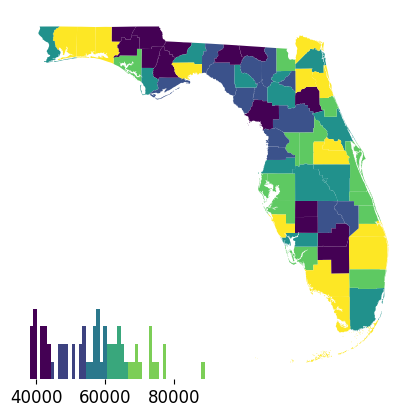

In [17]:
from legendgram import legendgram
import palettable.matplotlib as palmpl

f,ax = plt.subplots()

fl_income.plot('Median_income', k=5, ax=ax, scheme='Quantiles')

#bins returns the steps
bins = mapclassify.Quantiles(fl_income['Median_income'], k=5).bins

legendgram(f,ax,fl_income['Median_income'],bins,pal=palmpl.Viridis_5,
           
           legend_size=(0.5, 0.2), # legend size in fractions of the axis
           
           loc = 'lower left', # matplotlib-style legend locations
           
           )

ax.axis('off');

## Circle Symbol Map/Bubble Map

Get some data

In [18]:
from census import Census
import us

In [19]:
import os
from dotenv import load_dotenv
from pathlib import Path

env_file_path = Path('c:/users/' + os.getlogin() + 'Documents/GIS5103/GIS5103/.env')

load_dotenv()

get_census_api = os.getenv('census_api_key')

In [20]:
census_api_key = get_census_api

c = Census(census_api_key)

In [21]:
fl_census = c.acs5.state_county(fields = ('NAME', 'B01003_001E'), #variable names
                                      state_fips = '*', #state FIPS code for FL
                                      county_fips = "*", #"*" means all counties in the state
                                      year = 2019) # 2019 data

In [22]:
fl_df = pd.DataFrame(fl_census)
fl_df = fl_df.rename(columns={
    "B01003_001E": "total_population",})

In [23]:
url = us.states.FL.shapefile_urls()['county']
fl_county = gpd.read_file(url)

In [24]:
fl_df["GEOID10"] = fl_df["state"] + fl_df["county"]

fl_county_pop = pd.merge(fl_county, fl_df,on="GEOID10")

In [25]:
fl_county_pop.columns

Index(['STATEFP10', 'COUNTYFP10', 'COUNTYNS10', 'GEOID10', 'NAME10',
       'NAMELSAD10', 'LSAD10', 'CLASSFP10', 'MTFCC10', 'CSAFP10', 'CBSAFP10',
       'METDIVFP10', 'FUNCSTAT10', 'ALAND10', 'AWATER10', 'INTPTLAT10',
       'INTPTLON10', 'geometry', 'NAME', 'total_population', 'state',
       'county'],
      dtype='object')

### **Proportional vs. Graduated:** 

For **proportional symbol maps**, the size of the symbols are in direct relation to the value that is being displayed. **Graduated symbols** use symbol sizes to represent classes of data rather than unique or absolute values.

### Matplotlib's Graduated symbol map

C:\Users\alexb\AppData\Local\Temp\ipykernel_120\873663253.py:26: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  fl_county_pop.centroid.plot(


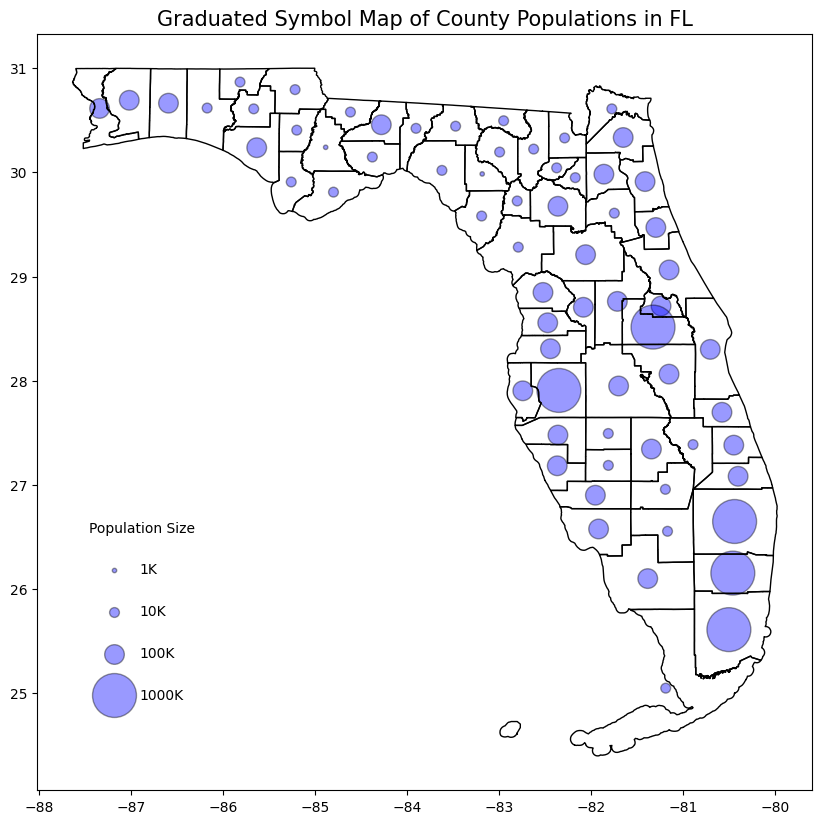

In [26]:
# Plot the base map
fig, ax = plt.subplots(figsize=(10, 10))

fl_county_pop.boundary.plot(ax=ax, linewidth=1,color='black')


ranges = [1000, 10000, 100000, 1000000]

sizes = [10, 50, 200, 1000]


# Function to normalize population size for symbol scaling
def scale_size(pop):
    
    if pop >= ranges[3]:
        return sizes[3]
    elif pop >= ranges[2]:
        return sizes[2]
    elif pop >= ranges[1]:
        return sizes[1]
    else:
        return sizes[0]

    
# Plot proportional circles
fl_county_pop.centroid.plot(
    ax=ax,
    color='blue',
    markersize=fl_county_pop['total_population'].apply(scale_size),
    alpha=0.4,
    edgecolor='k'
)

# Add title
plt.title('Graduated Symbol Map of County Populations in FL', fontsize=15)

# Create a legend with sample population sizes
for pop in ranges:
    plt.scatter([], [], s=scale_size(pop), color='blue', alpha=0.4, edgecolor='k', label=f'{pop//1000}K')

plt.legend(scatterpoints=1, frameon=False, labelspacing=2.0, title='Population Size',loc='lower left',
          bbox_to_anchor=(0.05, 0.1))



## GeoPlot's Proportional symbol map

C:\Users\alexb\AppData\Local\Temp\ipykernel_120\635175893.py:6: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  fl_county_pop_centroids['geometry'] = fl_county_pop_centroids.centroid


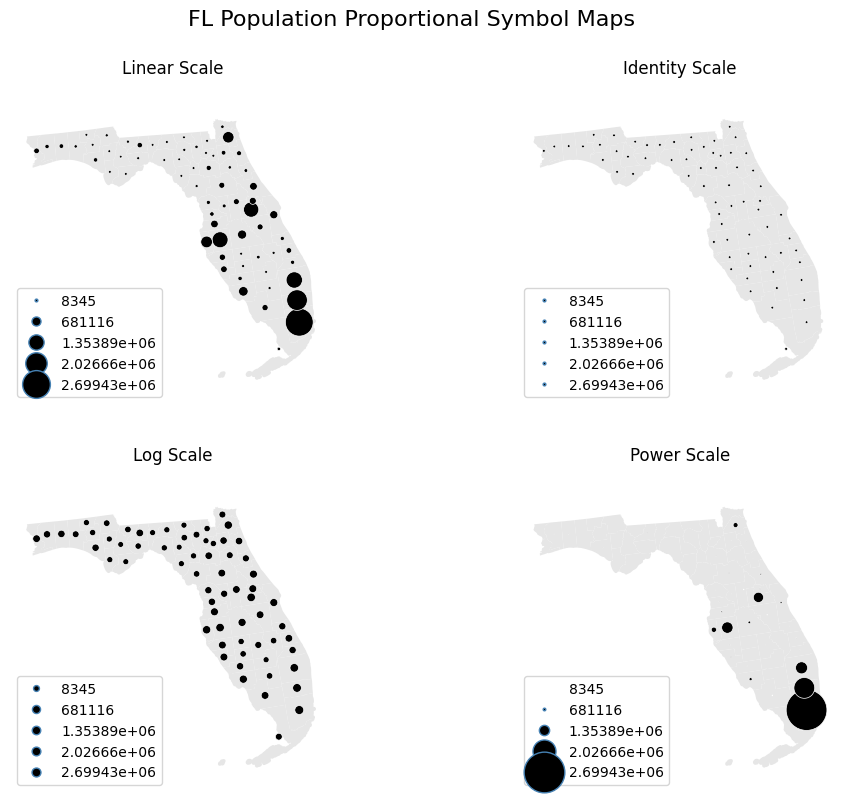

In [27]:
import geoplot as gplt
import geoplot.crs as gcrs


fl_county_pop_centroids = fl_county_pop.copy()
fl_county_pop_centroids['geometry'] = fl_county_pop_centroids.centroid


proj = gcrs.AlbersEqualArea(central_longitude=-98, central_latitude=39.5)

f, axes = plt.subplots(2, 2, figsize=(12, 9), subplot_kw={'projection': proj})

polyplot_kwargs = {'facecolor': (0.9, 0.9, 0.9), 'linewidth': 0}

pointplot_kwargs = {
    'scale': 'total_population', 'edgecolor': 'white', 'linewidth': 0.5, 'color': 'black',
    'legend': True
}


gplt.polyplot(fl_county_pop.geometry, ax=axes[0][0], **polyplot_kwargs)

gplt.pointplot(
    fl_county_pop_centroids,
    ax=axes[0][0], limits=(2, 20), **pointplot_kwargs
)
axes[0][0].set_title("Linear Scale")


def identity_scale(minval, maxval):
    def scalar(val):
        return 2
    return scalar


gplt.polyplot(fl_county_pop.geometry, ax=axes[0][1], **polyplot_kwargs)
gplt.pointplot(
    fl_county_pop_centroids,
    ax=axes[0][1], scale_func=identity_scale, **pointplot_kwargs
)
axes[0][1].set_title("Identity Scale")


def log_scale(minval, maxval):
    def scalar(val):
        val = val + abs(minval) + 1
        return np.log10(val)
    return scalar


gplt.polyplot(
    fl_county_pop.geometry,
    ax=axes[1][0], **polyplot_kwargs
)
gplt.pointplot(
    fl_county_pop_centroids,
    ax=axes[1][0], scale_func=log_scale, **pointplot_kwargs
)
axes[1][0].set_title("Log Scale")


def power_scale(minval, maxval):
    def scalar(val):
        val = val + abs(minval) + 1
        return (val / 500000)**2
    return scalar


gplt.polyplot(
    fl_county_pop.geometry,
    ax=axes[1][1], **polyplot_kwargs
)
gplt.pointplot(
    fl_county_pop_centroids,
    ax=axes[1][1], scale_func=power_scale, **pointplot_kwargs
)
axes[1][1].set_title("Power Scale")

plt.suptitle('FL Population Proportional Symbol Maps', fontsize=16)
plt.subplots_adjust(top=0.9)

## Kernel Density Heat Map

In [28]:
shelter = pd.read_csv("https://raw.githubusercontent.com/Ziqi-Li/GIS5103/refs/heads/main/data/Shelter_inventory.csv")

In [29]:
geometry = gpd.points_from_xy(shelter.Long, shelter.Lat)

shelter_gdf = gpd.GeoDataFrame(shelter, geometry=geometry, crs="EPSG:4326")

<Axes: >

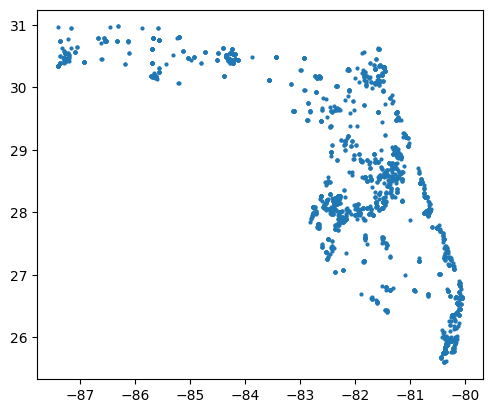

In [30]:
shelter_gdf.plot(markersize=4)

<Axes: xlabel='None', ylabel='None'>

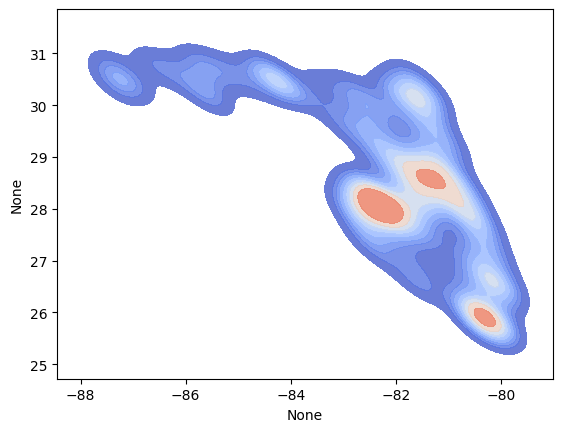

In [31]:
sns.kdeplot(data=shelter_gdf,
            x=shelter_gdf.geometry.x,
            y=shelter_gdf.geometry.y,
            bw_method=0.2,
            fill=True,
            cmap="coolwarm",
            alpha=0.8)

## Adding Basemaps

## [Contextily](https://contextily.readthedocs.io/en/latest/)

In [32]:
import contextily as cx 

Text(92.09722222222221, 0.5, 'Lat')

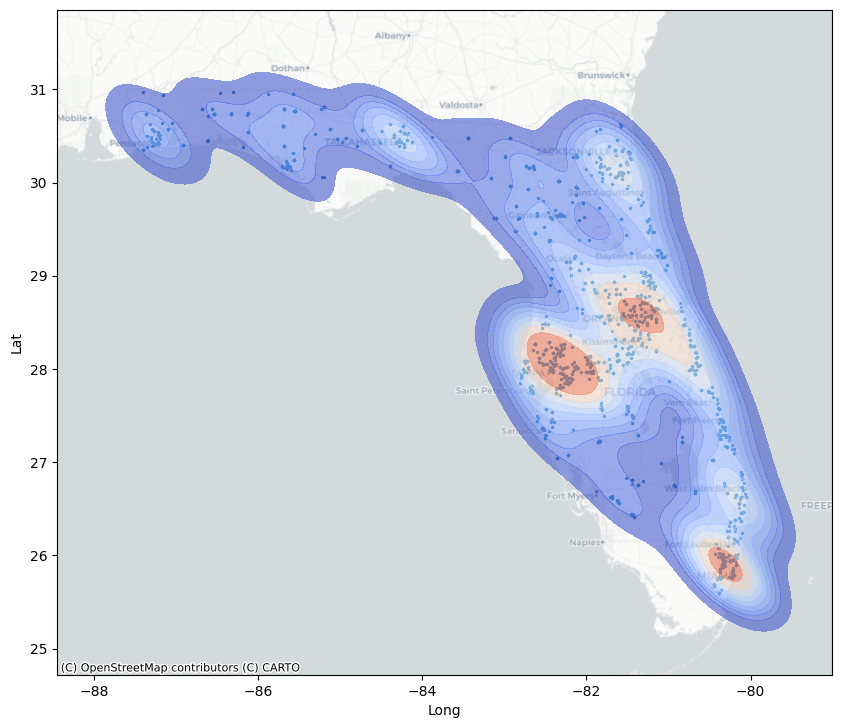

In [33]:
f, ax = plt.subplots(figsize=(10,10)) #Creata a map with size 10 by 10

shelter_gdf.plot(ax=ax, markersize = 2)

sns.kdeplot(ax=ax,data=shelter_gdf, x=shelter_gdf.geometry.x, y=shelter_gdf.geometry.y, bw_method=0.2, fill=True,
            cmap="coolwarm",alpha=0.6)

#This is the new line of code:
#We need to put a crs into the function.
#The source parameter defines the style of the base map: https://contextily.readthedocs.io/en/latest/providers_deepdive.html
#There are many options available.



cx.add_basemap(ax, source=cx.providers.CartoDB.Positron, crs=shelter_gdf.crs,zoom=7) # we need to put a crs into the function.

#put label on top of heat map
#cx.add_basemap(ax, source=cx.providers.CartoDB.PositronNoLabels, crs=shelter_gdf.crs,zoom=7)
#cx.add_basemap(ax, source=cx.providers.CartoDB.PositronOnlyLabels, crs=shelter_gdf.crs,zoom=7) 


ax.set_xlabel("Long")
ax.set_ylabel("Lat")

#plt.savefig("clusters.png",dpi=600)

### GeoPlot

In [34]:
shelter_gdf.head()

,Name,Address,City,Long,Lat,FACILITY_T,SHELTER_TY,Year_Built,Building,Risk_Capac,Risk_Squar,geometry
0,Easton-Newberry Sports Complex,24880 NW 16th Ave,Newberry,-82.604255,29.669064,SHELTER,RISK,2008,1 Main,593,11860,POINT (-82.60426 29.66906)
1,University of Florida,3150 Hull Rd,Gainesville,-82.368263,29.638181,SHELTER,RISK,2007,110 Steinbrenner Hall 1st Floor,163,3261,POINT (-82.36826 29.63818)
2,Meadowbrook ES,11525 NW 39th Ave,Gainesville,-82.462776,29.688149,SHELTER,RISK,2011,1 Media / Classroom,900,18000,POINT (-82.46278 29.68815)
3,Sidney Lanier Center,312 NW 16th Ave,Gainesville,-82.328008,29.666899,SHELTER,RISK,2001,11 Classroom,552,11040,POINT (-82.32801 29.6669)
4,Lawton M Chiles ES,2525 School House Rd,Gainesville,-82.445166,29.628691,SHELTER,RISK,1999,3 Cafeteria,266,5320,POINT (-82.44517 29.62869)


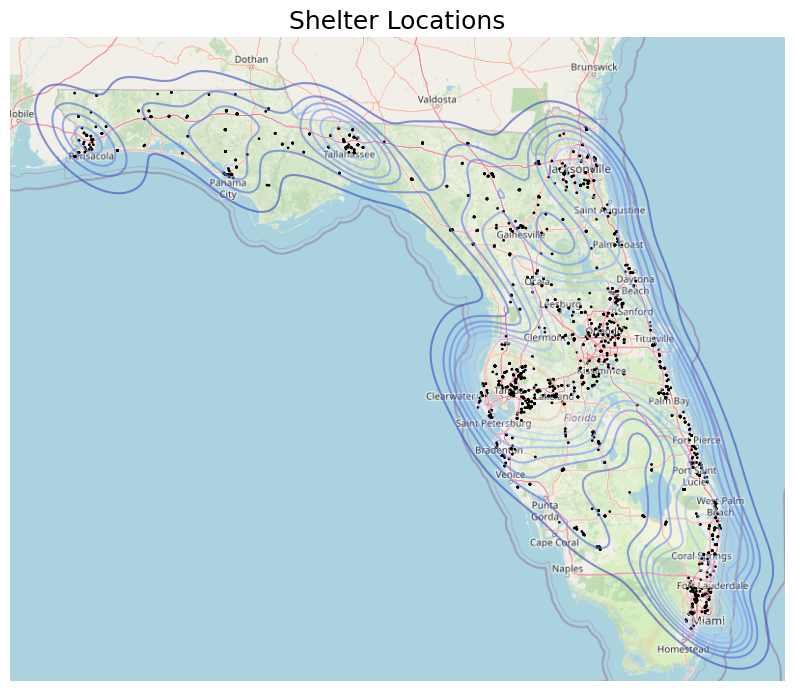

In [35]:
ax = gplt.kdeplot(
    shelter_gdf, cmap='coolwarm', projection=gcrs.WebMercator(), figsize=(10, 10),
    fill=False,alpha=0.6,bw_method=0.2
)

# if fill=True then you get an error. The error is discussed in this Issue Report on the github for seaborn
# https://github.com/mwaskom/seaborn/issues/3694

gplt.pointplot(shelter_gdf, s=1, color='black', ax=ax)
gplt.webmap(shelter_gdf, ax=ax)
plt.title('Shelter Locations', fontsize=18);

## [Folium](https://python-visualization.github.io/folium/latest/index.html)

In [36]:
#pip install folium

In [37]:
import folium
from folium import plugins

map = folium.Map(location=[28, -84], tiles="CartoDB positron", zoom_start=7)

heat_data = [[point.xy[1][0], point.xy[0][0]] for point in shelter_gdf.geometry]

plugins.HeatMap(heat_data,radius = 15).add_to(map)

map

### Folium Choropoleth Map

In [38]:
map = folium.Map(location=[28, -84], tiles="CartoDB positron", zoom_start=7)


folium.Choropleth(
    geo_data=fl_income.set_index("COUNTYNAME"),
    name="choropleth",
    data=fl_income,
    columns=["COUNTYNAME", "Median_income"],
    key_on="feature.id",
    fill_color="YlGn",
    fill_opacity=0.7,
    line_opacity=0.5,
    legend_name="Median Income ($)",
).add_to(map)

folium.LayerControl().add_to(map)

map

## Plotly [Gallary](https://plotly.com/python/)

In [39]:
#pip install nbformat

In [40]:
#pip install plotly

In [47]:
import plotly.express as px


fig = px.choropleth_mapbox(fl_income, 
                           geojson=fl_income.geometry,
                           locations=fl_income.index, 
                           color='Median_income',
                           center={"lat": 28, "lon": -84},
                           mapbox_style="carto-positron",
                           zoom=6, width=1000, height=800)


fig.show()
#fig.write_html("fl_income.html")

#pip install kaleido
#fig.write_image("fl_income.png")

In [53]:
# pip install -U kaleido

In [50]:
import kaleido

## Color suggestions:

If you want to use colors other than provided by `matplotlib`, you can find hex code of the colors and use them instead. Below are some references.

- https://colorbrewer2.org/#type=sequential&scheme=BuGn&n=3 **< -- my preference**
- https://leonardocolor.io/scales.html#
- https://vega.github.io/vega/docs/schemes/#:~:text=Multi%2DHue%20Schemes-,Sequential%20color%20schemes%20can%20be%20used%20to%20encode%20quantitative%20values,for%20visualizations%20such%20as%20heatmaps.

In [66]:
from matplotlib.colors import ListedColormap

hex_color = [
    "#f0f9e8", 
    "#bae4bc", 
    "#7bccc4", 
    "#43a2ca", 
    "#0868ac"
    ]
# hex_color.reverse()

# Create a custom colormap using ColorBrewer hex codes
cmap = ListedColormap(hex_color)

Text(0.5, 1.0, 'County Median Income')

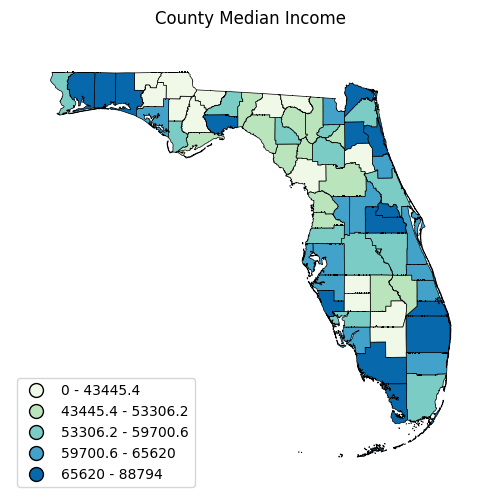

In [67]:
import geopandas as gpd
import geoplot as gplt
import geoplot.crs as gcrs
import matplotlib.pyplot as plt

gplt.choropleth(
    fl_income,
    hue='Median_income',
    cmap=cmap, linewidth=0.5,
    edgecolor='black',
    legend=True,
    scheme = mapclassify.Quantiles(fl_income.Median_income, k=5),
    projection=gcrs.WebMercator(),
    legend_kwargs={'loc': 'lower left'},
)
plt.title("County Median Income")
